# **Data Preparation**

**Importing the necessary libraries**

In [3]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import math
import glob
import tensorflow as tf
from tensorflow.keras import Sequential 
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, Dropout,Activation
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn import metrics
import os
import sys
import pandas as pd
import random

**Getting the data**

In [4]:
dogs = glob.glob("dog*.jpg")
trees = glob.glob("tree*.jpg")

In [5]:
trees_images = [np.asarray(Image.open(i).resize((500,500))) for i in trees]
dogs_images = [np.asarray(Image.open(i).resize((500,500))) for i in dogs]

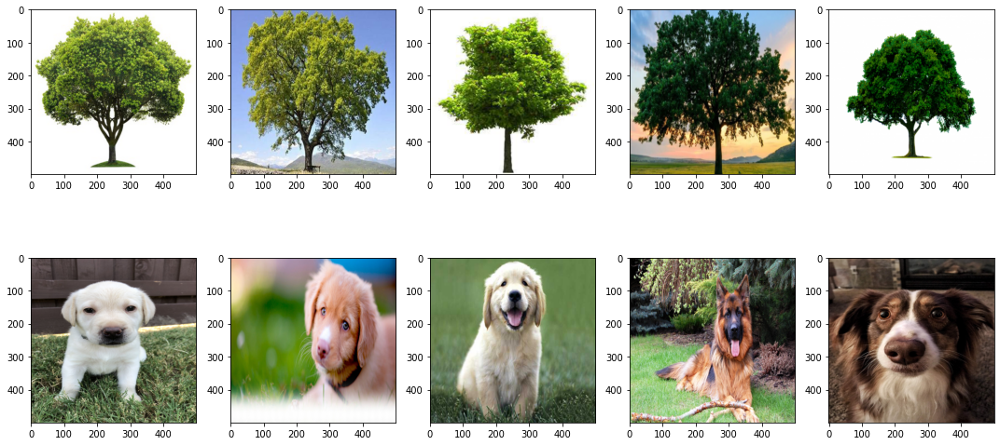

In [45]:
fig, axes = plt.subplots(2,5,figsize=(15,8))
for i in range(5):
    axes[0,i].imshow(trees_images[i])
    axes[1,i].imshow(dogs_images[i])
plt.tight_layout()

In [46]:
print("Trees Shapes:")
for i in range(5):
    print(trees_images[i].shape)
    
print("Dogs Shapes:")
for i in range(5):
    print(dogs_images[i].shape)

Trees Shapes:
(500, 500, 3)
(500, 500, 3)
(500, 500, 3)
(500, 500, 3)
(500, 500, 3)
Dogs Shapes:
(500, 500, 3)
(500, 500, 3)
(500, 500, 3)
(500, 500, 3)
(500, 500, 3)


# **Transformations**


**Random Rotation**

In [6]:
def rotate_image(image):
    upper_limit = 360
    lower_limit = 0
    degree=random.randint(lower_limit, upper_limit)
    rads = math.radians(degree)
    rot_img = np.uint8(np.zeros(image.shape))
    height = rot_img.shape[0]
    width  = rot_img.shape[1]
    midx,midy = (width//2, height//2)
    for i in range(rot_img.shape[0]):
        for j in range(rot_img.shape[1]):
            x= (i-midx)*math.cos(rads)+(j-midy)*math.sin(rads)
            y= -(i-midx)*math.sin(rads)+(j-midy)*math.cos(rads)
            x=round(x)+midx 
            y=round(y)+midy 
            if (x>=0 and y>=0 and x<image.shape[0] and  y<image.shape[1]):
                rot_img[i,j,:] = image[x,y,:]

    return np.uint8(rot_img)

**Vertical Flipping**

In [7]:
def vertical_flipping(image):
    vertical_image = np.array(list(reversed(image)))
    return np.uint8(vertical_image)

**Horizontal Flipping**

In [8]:
def horizontal_flipping(image):
    horizontal_image=image = np.array([list(reversed(row)) for row in image])
    return np.uint8(horizontal_image)

**Translation along X**

In [9]:
def translation_image_x(image):
    h,w = image.shape[:2]
    x_distance = random.randint(1, 100)
    y_distance=0
    ts_mat = np.array([[1,0,x_distance],[0,1,y_distance]])
    img_translate_x = np.zeros(image.shape,dtype='u1')
    for i in range(h):
        for j in range(w):
            origin_x = j
            origin_y = i
            origin_xy = np.array([origin_x,origin_y,1])
            new_xy = np.dot(ts_mat,origin_xy)
            new_x = new_xy[0]
            new_y = new_xy[1]
            if 0<new_x < w and 0<new_y < h:
                img_translate_x[new_y,new_x]  = image[i,j]
    return  np.uint8(img_translate_x)

**Translation along Y**

In [10]:
def translation_image_y(image):
    h,w = image.shape[:2]
    x_distance = 0
    y_distance=random.randint(1, 100)
    ts_mat = np.array([[1,0,x_distance],[0,1,y_distance]])
    img_transalte_y = np.zeros(image.shape,dtype='u1')
    for i in range(h):
        for j in range(w):
            origin_x = j
            origin_y = i
            origin_xy = np.array([origin_x,origin_y,1])
            new_xy = np.dot(ts_mat,origin_xy)
            new_x = new_xy[0]
            new_y = new_xy[1]
            if 0<new_x < w and 0<new_y < h:
                img_transalte_y[new_y,new_x]  = image[i,j]
    return np.uint8(img_transalte_y)

**Cropping**

In [11]:
def cropping(image):
    crop_image=np.copy(image)
    height=crop_image.shape[0]
    weight=crop_image.shape[1]
    h=random.randint(0,int(height))
    w=random.randint(0,int(weight))
    for x in range(w):
        for y in range(h):
            crop_image[x][y]=0
    return np.uint8(crop_image)

**Zooming**

In [12]:
def zooming(image,):
    height, width = image.shape[0], image.shape[1]
    x_start = height // 2
    y_start = width // 2
    imx = image[x_start-(height//4):x_start+(height//4), y_start-(width//4):y_start+(width//4)]
    zoomed_image = np.zeros(image.shape)
    for x in range(imx.shape[0]):
        for y in range(imx.shape[1]):
            zoomed_image[x*2,y*2] = imx[x,y]
    for x in range(height):
        for y in range(width):
            if np.all(zoomed_image[x,y] == 0):
                if y == width-1:
                    zoomed_image[x,y] = zoomed_image[x,y-1]
                else:
                    zoomed_image[x,y] = (zoomed_image[x,y-1] + zoomed_image[x,y+1]) // 2          
    for x in range(height):
        for y in range(width):
            if np.all(zoomed_image[x,y] == 0):
                if x == height-1:
                    zoomed_image[x,y] = zoomed_image[x-1,y]
                else:
                    zoomed_image[x,y] = (zoomed_image[x-1,y] + zoomed_image[x+1,y]) // 2
    return np.uint8(zoomed_image)

**Color Modification**

In [13]:
def color_modification(image):
    img_R = np.copy(image)
    img_R[:, :, (1, 2)] = 0
    return np.uint8(img_R)

**Adding Light Gaussian Noise**

In [14]:
def light_gaussian_noise(image):
    row,col,ch= image.shape
    mean = 0
    var = 0.8
    sigma = var**2
    gauss = np.random.normal(mean,sigma,(row,col,ch))
    noisy = image+ gauss
    return np.uint8(noisy)

**Illumination**

In [15]:
def illumination(image):
    image_ill=image/2
    return np.uint8(image_ill)

# **Data Visualization**

In [47]:
def plot_image(image,fun,title):
    new_image = fun(image)
    colors = ("red","green","blue")
    fig, ax = plt.subplots(1,2,figsize=(15,10))
    fig.tight_layout()
    fig.suptitle(title, fontsize=30,fontweight="bold", fontstyle="italic", y=0.95)
    ax[0].imshow(image)
    ax[0].set_title("Original Image",fontsize=20)
    ax[1].imshow(new_image)
    ax[1].set_title("New Image",fontsize=20)
        
    plt.show()

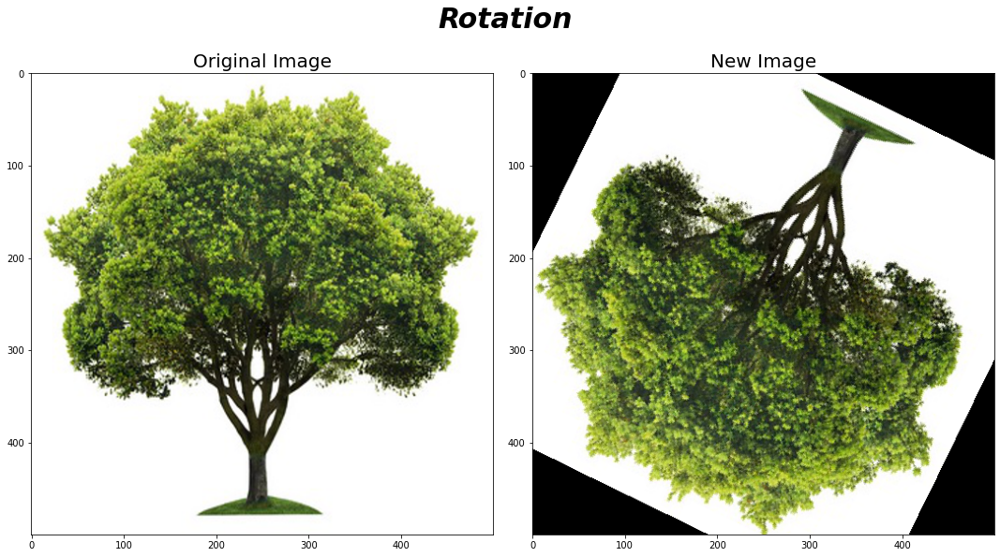

In [48]:
plot_image(trees_images[0],rotate_image,"Rotation")

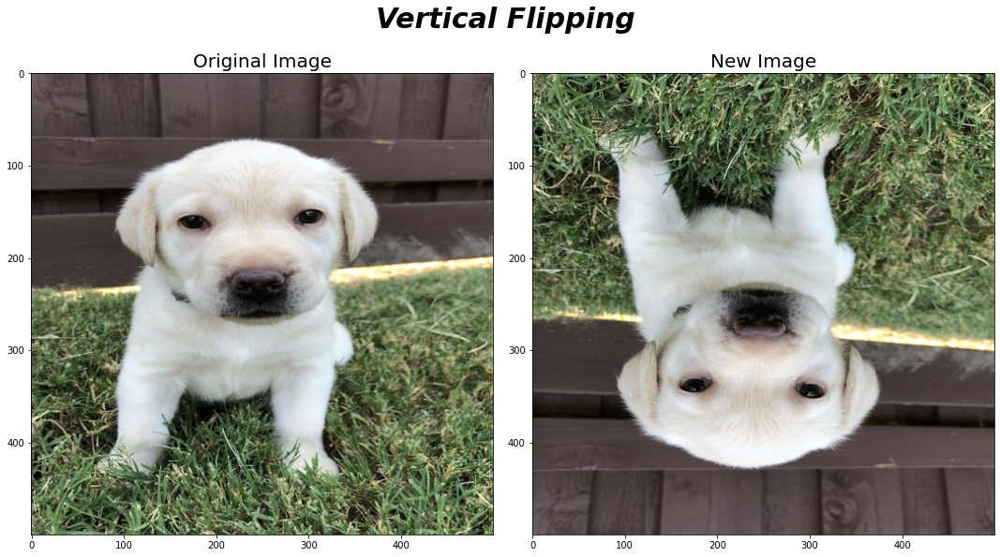

In [49]:
plot_image(dogs_images[0],vertical_flipping,"Vertical Flipping")

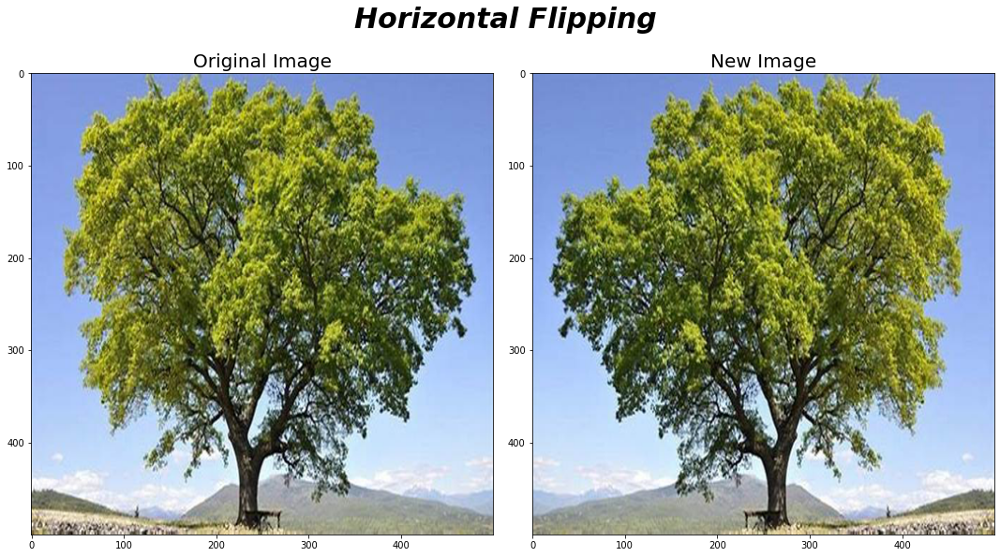

In [50]:
plot_image(trees_images[1],horizontal_flipping,"Horizontal Flipping")

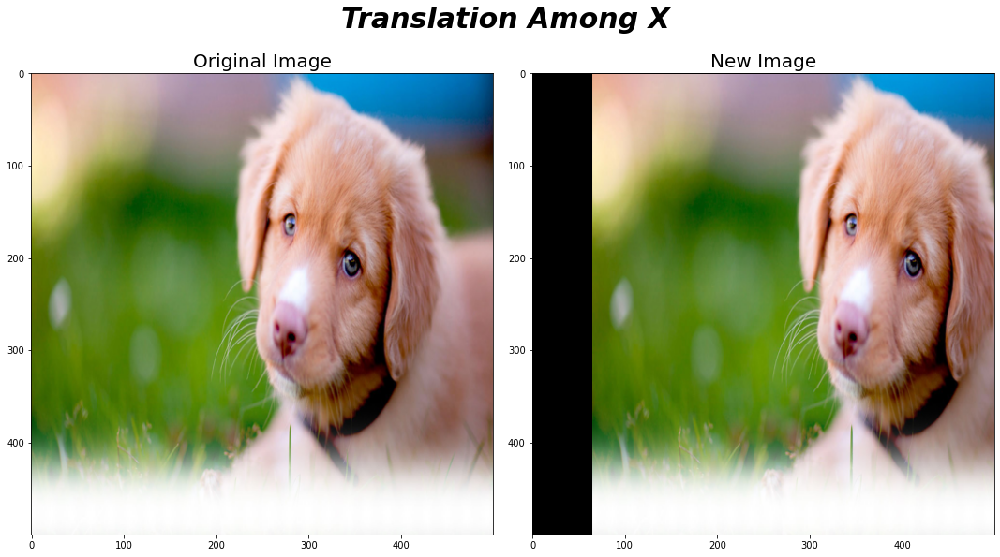

In [51]:
plot_image(dogs_images[1],translation_image_x,"Translation Among X")

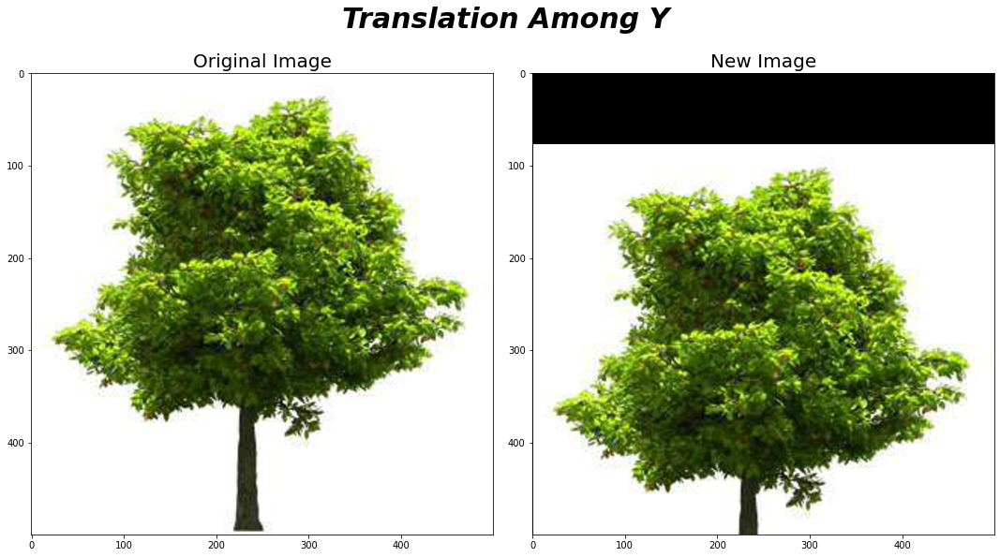

In [52]:
plot_image(trees_images[2],translation_image_y,"Translation Among Y")

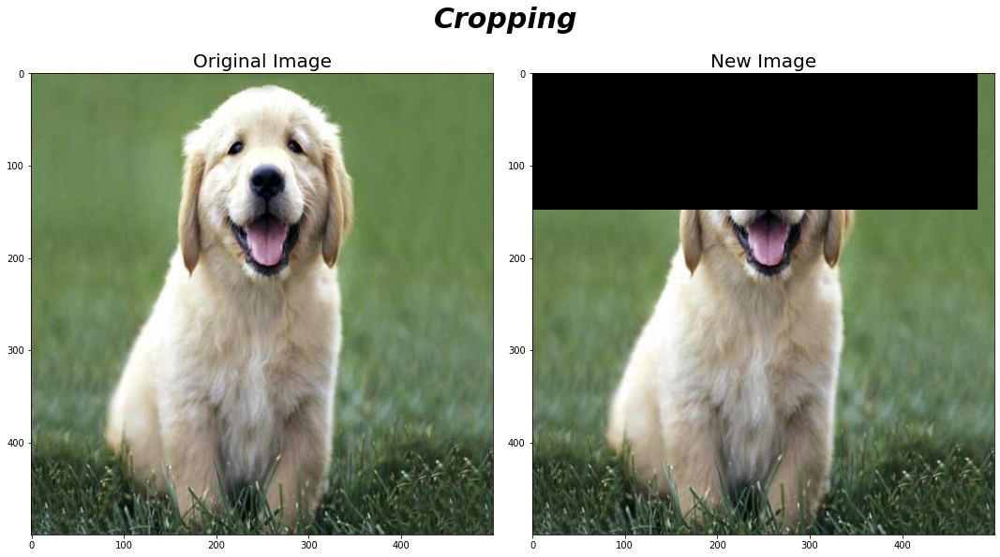

In [53]:
plot_image(dogs_images[2],cropping,"Cropping")

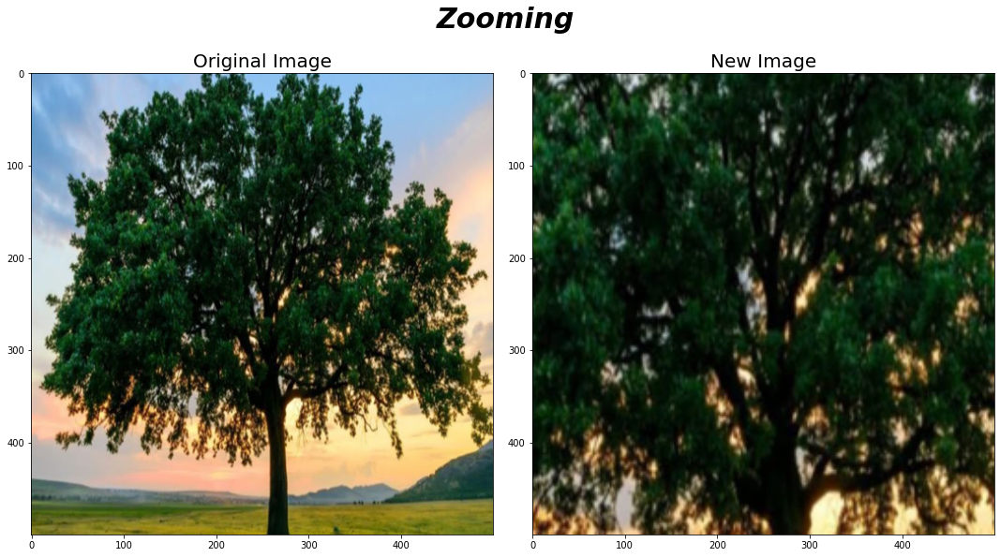

In [54]:
plot_image(trees_images[3],zooming,"Zooming")

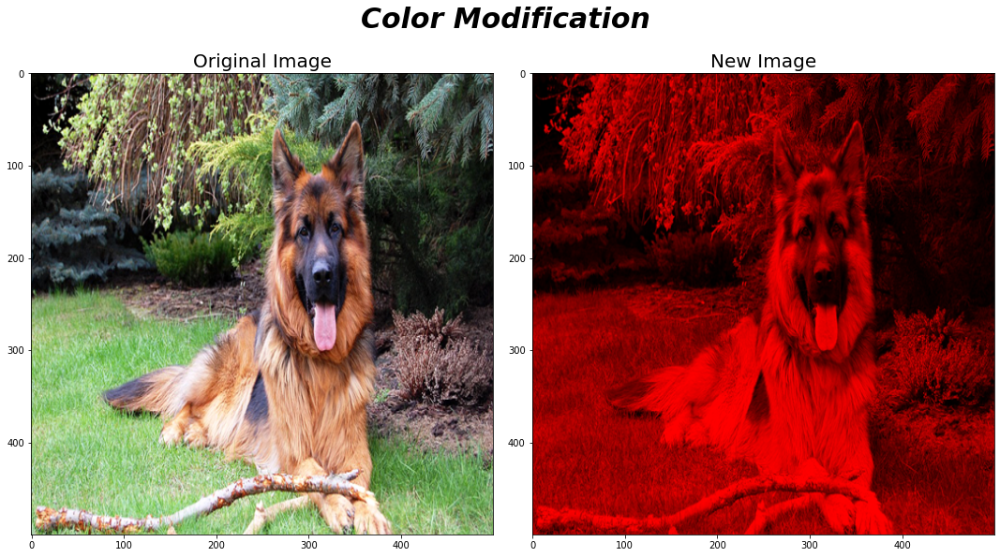

In [55]:
plot_image(dogs_images[3],color_modification,"Color Modification")

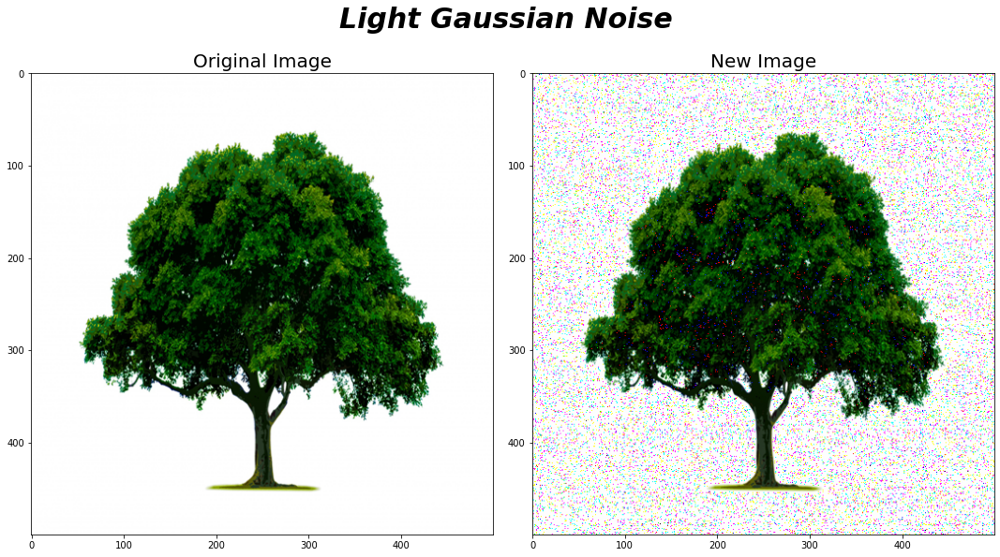

In [56]:
plot_image(trees_images[4],light_gaussian_noise,"Light Gaussian Noise")

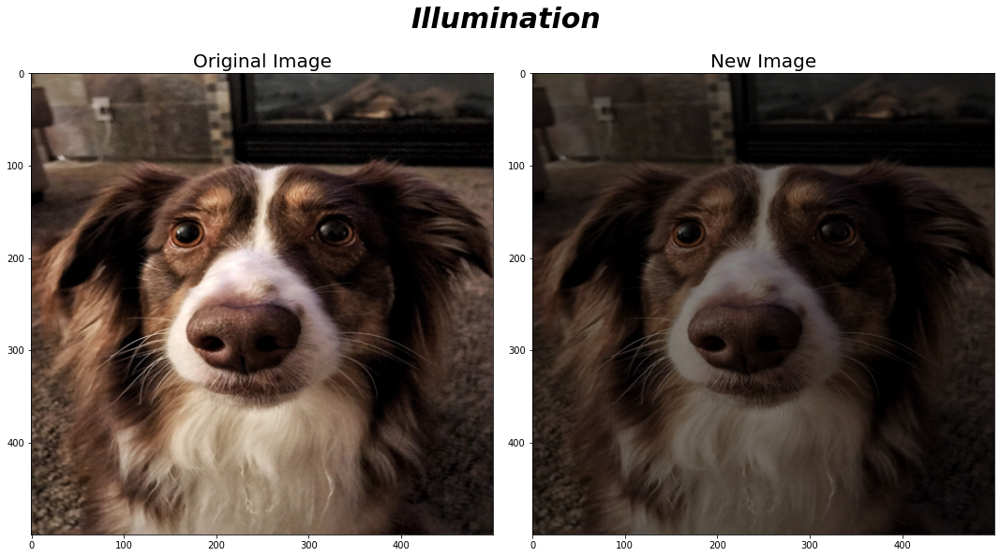

In [57]:
plot_image(dogs_images[4],illumination,"Illumination")

# **Histograms**

In [58]:
def plot_histogram(image,fun):
    new_image = fun(image)
    colors = ("red","green","blue")
    fig, ax = plt.subplots(2,2,figsize=(16,8))
    fig.tight_layout()
    ax[0,0].imshow(image,aspect="auto")
    ax[0,0].set_title("Original Image")
    ax[0,1].imshow(new_image,aspect="auto")
    ax[0,1].set_title("Modified Image")
    ax[1,0].set_xlim([0,256])
    ax[1,1].set_xlim([0,256])
    for channel_id, color in enumerate(colors):
        histogram, bin_edges = np.histogram(
            image[:,:,channel_id], bins=256, range=(0,256)
        )
        ax[1,0].plot(bin_edges[0:-1],histogram,color=color)
        histogram, bin_edges = np.histogram(
            new_image[:,:,channel_id], bins=256, range=(0,256)
        )
        ax[1,1].plot(bin_edges[0:-1],histogram,color=color)
        
    ax[1,0].set_xlabel("Color value")
    ax[1,1].set_xlabel("Color value")
    ax[1,0].set_ylabel("Pixel Count")
    ax[1,1].set_ylabel("Pixel count")

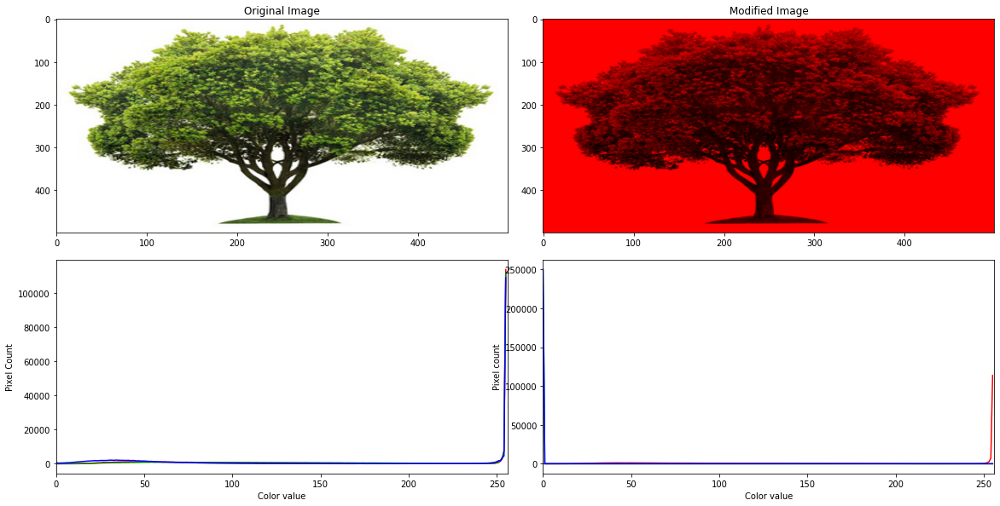

In [63]:
plot_histogram(trees_images[0],color_modification)

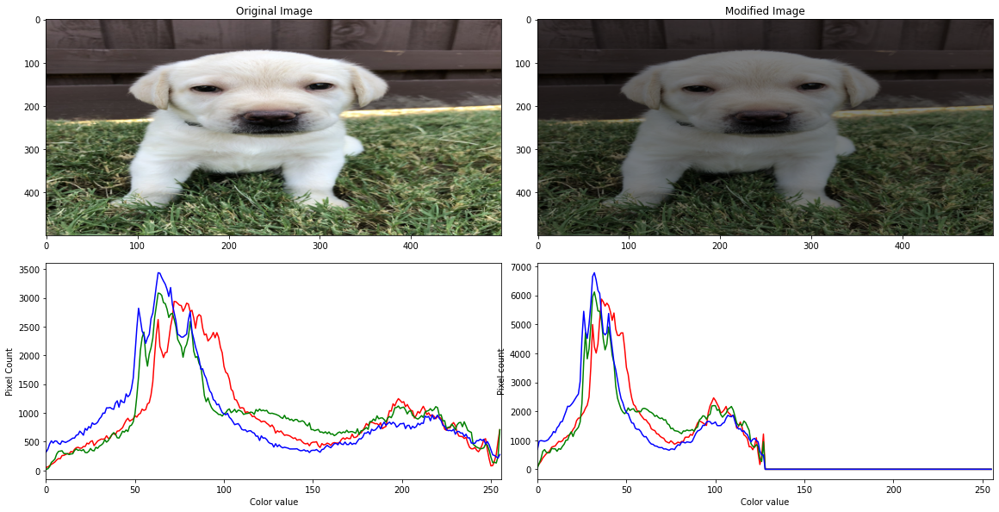

In [62]:
plot_histogram(dogs_images[0],illumination)

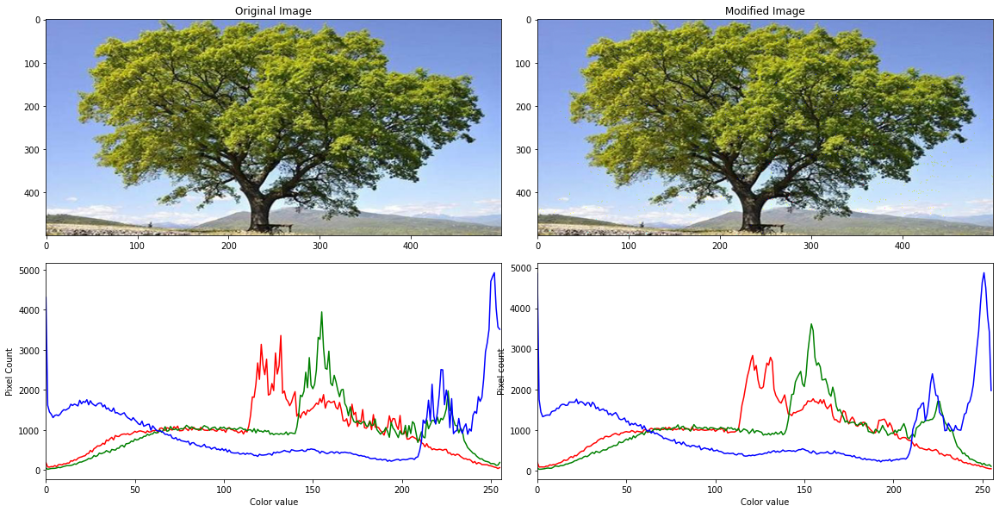

In [66]:
plot_histogram(trees_images[1],light_gaussian_noise)

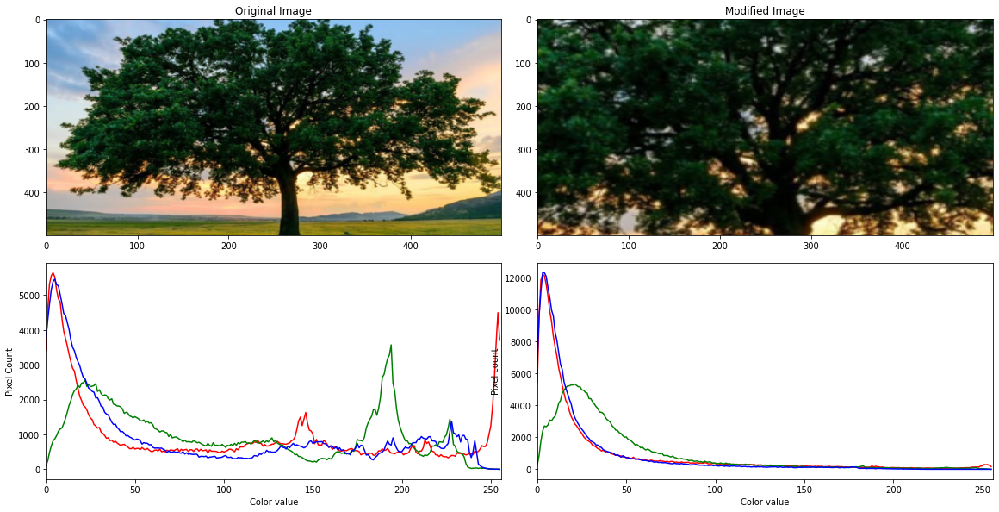

In [67]:
plot_histogram(trees_images[3],zooming)

# **Binary Classification**

**Generating the new trees and dogs**



In [16]:
new_trees=[]
for i in range(len(trees_images)):
    new_trees.append(rotate_image(trees_images[i]))
    new_trees.append(vertical_flipping(trees_images[i]))
    new_trees.append(horizontal_flipping(trees_images[i]))
    new_trees.append(translation_image_x(trees_images[i]))
    new_trees.append(translation_image_y(trees_images[i]))
    new_trees.append(zooming(trees_images[i]))
    new_trees.append(cropping(trees_images[i]))
    new_trees.append(color_modification(trees_images[i]))
    new_trees.append(light_gaussian_noise(trees_images[i]))
    new_trees.append(illumination(trees_images[i]))


In [17]:
new_dogs=[]
for i in range(len(dogs_images)):
    new_dogs.append(rotate_image(dogs_images[i]))
    new_dogs.append(vertical_flipping(dogs_images[i]))
    new_dogs.append(horizontal_flipping(dogs_images[i]))
    new_dogs.append(translation_image_x(dogs_images[i]))
    new_dogs.append(translation_image_y(dogs_images[i]))
    new_dogs.append(zooming(dogs_images[i]))
    new_dogs.append(cropping(dogs_images[i]))
    new_dogs.append(color_modification(dogs_images[i]))
    new_dogs.append(light_gaussian_noise(dogs_images[i]))
    new_dogs.append(illumination(dogs_images[i]))

**Creating X and Y for classification**

In [18]:
X=np.array(trees_images + new_trees + dogs_images + new_dogs)
Y=np.concatenate([np.ones(55), np.zeros(55)])

In [19]:
print(len(trees_images))
print(len(new_trees))

5
50


In [20]:
X.shape

(110, 500, 500, 3)

In [21]:
Y.shape

(110,)

**Data Preprocessing**

In [22]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)

In [23]:
X_train = X_train.astype("float32") /  255
X_test = X_test.astype("float32") / 255

In [24]:
Y_train = to_categorical(Y_train)
Y_test = to_categorical(Y_test)

**Creating the model**

I am aware that this section presents an overfitting problem, but my computer didn't want to fit more than 5 epochs due to RAM problems. I had to switch to colab to train the model. I tried different models but it's the same problem.

In [25]:
model = Sequential()
model.add(Conv2D(16,kernel_size=(3,3),input_shape=X_train.shape[1:],activation="relu"))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(32,kernel_size=(3,3),activation="relu"))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(64,activation="relu"))
model.add(Dense(2,activation="softmax"))

In [29]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 498, 498, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 249, 249, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 247, 247, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 123, 123, 32)     0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 484128)            0         
                                                                 
 dropout (Dropout)           (None, 484128)            0

**Compiling the model**

After a test accuracy comparison between the optimizers rmsprop,adam and sgd , rmsprop has the highest test accuracy

In [30]:
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

**Fitting the model**

In [33]:
fit=model.fit(X_train,Y_train,epochs=5,batch_size=11,validation_split=0.1)

Epoch 1/5
8/8 [==============================] - 16s 2s/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 4.4240e-04 - val_accuracy: 1.0000
Epoch 2/5
8/8 [==============================] - 16s 2s/step - loss: 9.0590e-04 - accuracy: 1.0000 - val_loss: 3.6905e-04 - val_accuracy: 1.0000
Epoch 3/5
8/8 [==============================] - 16s 2s/step - loss: 0.0700 - accuracy: 0.9873 - val_loss: 1.4987e-04 - val_accuracy: 1.0000
Epoch 4/5
8/8 [==============================] - 16s 2s/step - loss: 3.6452e-04 - accuracy: 1.0000 - val_loss: 7.1586e-05 - val_accuracy: 1.0000
Epoch 5/5
8/8 [==============================] - 17s 2s/step - loss: 1.5382e-04 - accuracy: 1.0000 - val_loss: 3.3881e-05 - val_accuracy: 1.0000


**Evaluating the model**

In [34]:
score = model.evaluate(X_test, Y_test, verbose=0)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Test loss: 0.01076635904610157
Test accuracy: 1.0


In [35]:
y_pred = model.predict(X_test)

1/1 [==============================] - 1s 1s/step


In [38]:
y_pred_class = np.argmax(y_pred,axis=1)
y_test_class = np.argmax(Y_test,axis=1)

In [39]:
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(y_test_class, y_pred_class)
print(cm)

[[11  0]
 [ 0 11]]


Text(69.0, 0.5, 'Truth')

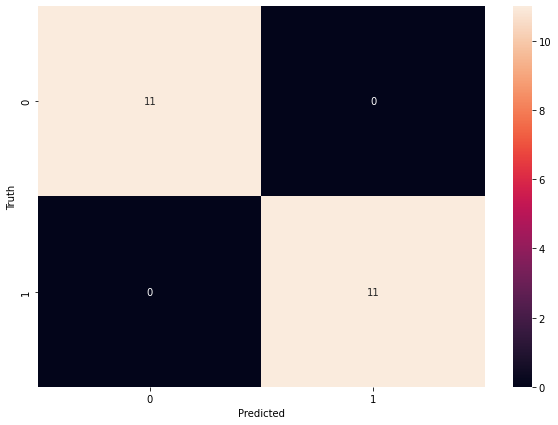

In [43]:
import seaborn as sn
plt.figure(figsize=(10,7))
sn.heatmap(cm,annot=True)
plt.xlabel("Predicted")
plt.ylabel("Truth")

In [44]:
print(metrics.classification_report(y_test_class,y_pred_class,target_names=["dog","tree"]))

              precision    recall  f1-score   support

         dog       1.00      1.00      1.00        11
        tree       1.00      1.00      1.00        11

    accuracy                           1.00        22
   macro avg       1.00      1.00      1.00        22
weighted avg       1.00      1.00      1.00        22

